#Team Details:

##Rama Krishna Reddy Molakaseema- rmolakas
##Sarah Chothiakadavil Abraham - schothia
##Aishwarya Nayak - anayak


###Importing all the required Libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer

###Reading the dataset

In [2]:
news=pd.read_csv("news.csv")

In [3]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline
0,Tr3CMgRv1N,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02 00:00:00,-1,-1,-1,0.000000,-0.053300
1,Wc81vGp8qZ,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20 00:00:00,-1,-1,-1,0.208333,-0.156386
2,zNGH03CrZH,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28 00:00:00,-1,-1,-1,-0.425210,0.139754
3,3sM1H0W8ts,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01 00:06:00,-1,-1,-1,0.000000,0.026064
4,wUbnxgvqaZ,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01 00:11:00,-1,-1,-1,0.000000,0.141084


In [4]:
news.shape

(55932, 11)

###Description and Summary of the dataset

In [5]:
news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55932 entries, 0 to 55931
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   IDLink             55932 non-null  object 
 1   Title              55932 non-null  object 
 2   Headline           55932 non-null  object 
 3   Source             55757 non-null  object 
 4   Topic              55932 non-null  object 
 5   PublishDate        55932 non-null  object 
 6   Facebook           55932 non-null  int64  
 7   GooglePlus         55932 non-null  int64  
 8   LinkedIn           55932 non-null  int64  
 9   SentimentTitle     55932 non-null  float64
 10  SentimentHeadline  55932 non-null  float64
dtypes: float64(2), int64(3), object(6)
memory usage: 4.7+ MB


In [6]:
news.describe()

,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline
count,55932.000000,55932.000000,55932.000000,55932.000000,55932.000000
mean,132.050329,4.551616,14.300132,-0.006318,-0.029577
std,722.931314,21.137177,76.651420,0.137569,0.143038
min,-1.000000,-1.000000,-1.000000,-0.838525,-0.755355
25%,0.000000,0.000000,0.000000,-0.079057,-0.116927
50%,6.000000,0.000000,0.000000,0.000000,-0.027277
75%,37.000000,2.000000,4.000000,0.063969,0.057354
max,49211.000000,1267.000000,3716.000000,0.962354,0.964646


Observations:

*   For all three platforms, the median is much lower than the mean, suggesting a right-skewed distribution with a majority of news articles receiving low engagement but a few articles receiving very high engagement.
*   Facebook appears to be the most engaging platform for news articles, followed by LinkedIn and then GooglePlus.
*   The sentiment analysis indicates a very slight overall negative tilt along with a range of emotional tones in news titles and headlines.
*   For all three platforms, the median is much lower than the mean, suggesting a right-skewed distribution with a majority of news articles receiving low engagement

#Cleaning the dataset

### 1. Finding and Treating Null Values

In [7]:
news.isna().sum()

IDLink                 0
Title                  0
Headline               0
Source               175
Topic                  0
PublishDate            0
Facebook               0
GooglePlus             0
LinkedIn               0
SentimentTitle         0
SentimentHeadline      0
dtype: int64

In [8]:
news.Source.value_counts()[:5]

Source
Bloomberg         992
Reuters           763
ABC News          645
New York Times    573
The Guardian      551
Name: count, dtype: int64

###Filling the null values with the most published source

In [9]:
news['Source'].fillna('Bloomberg', inplace = True)
news.dropna(inplace = True)

/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/3638829872.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  news['Source'].fillna('Bloomberg', inplace = True)


### 2. Extracting Date and Time from Date

In [10]:
news['PublishDate'] = pd.to_datetime(news['PublishDate'])
news['PublishTime'] = news['PublishDate'].dt.time
news['PublishDate'] = news['PublishDate'].dt.date

In [11]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime
0,Tr3CMgRv1N,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02,-1,-1,-1,0.000000,-0.053300,00:00:00
1,Wc81vGp8qZ,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20,-1,-1,-1,0.208333,-0.156386,00:00:00
2,zNGH03CrZH,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28,-1,-1,-1,-0.425210,0.139754,00:00:00
3,3sM1H0W8ts,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01,-1,-1,-1,0.000000,0.026064,00:06:00
4,wUbnxgvqaZ,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01,-1,-1,-1,0.000000,0.141084,00:11:00


Separating the date and the time into separate columns for the ease of working and analysis.

###3. Converting all the entries in the sources into lower caps

In [12]:
news.Source.unique()

array(['USA TODAY', 'Bloomberg', 'RTT News', ..., 'KERA News',
       'KEVN Black Hills Fox', 'SHRM'], dtype=object)

Some of the values in the source are present in different letter cases.

In [13]:
news['Source'] = news['Source'].apply(lambda x:x.lower())

In [14]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime
0,Tr3CMgRv1N,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,usa today,obama,2002-04-02,-1,-1,-1,0.000000,-0.053300,00:00:00
1,Wc81vGp8qZ,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",bloomberg,economy,2008-09-20,-1,-1,-1,0.208333,-0.156386,00:00:00
2,zNGH03CrZH,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",bloomberg,economy,2012-01-28,-1,-1,-1,-0.425210,0.139754,00:00:00
3,3sM1H0W8ts,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,rtt news,economy,2015-03-01,-1,-1,-1,0.000000,0.026064,00:06:00
4,wUbnxgvqaZ,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,the nation - thailand&#39;s english news,economy,2015-03-01,-1,-1,-1,0.000000,0.141084,00:11:00


### 4. Some news articles arent from the date range of the dataset

It is given that the News items in the dataset belongs to a range of dates but we can find out that some news items does not belong in the specified dates.

In [15]:
news = news[(news['PublishDate']>=pd.to_datetime('2015-11-01').date()) & (news['PublishDate']<=pd.to_datetime('2016-07-07').date())]

In [16]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,the wall street journal,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",forbes,microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00


### 5. Checking for duplicate rows

In [17]:
news[news.duplicated()]

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime


It is evident that here are no duplicate rows in the news dataset.

### 6. Treating the outliers in the dataset

In [18]:
cols = news.select_dtypes(include=['int64', 'float64']).columns
for col in cols:
    q1 = news[col].quantile(0.25)
    q3 = news[col].quantile(0.75)

    IQR = q3 - q1

    lb = q1 - 1.5 * IQR
    ub = q3 + 1.5 * IQR

    news = news[(news[col] >= lb) & (news[col] <= ub)]

In [19]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,the wall street journal,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",forbes,microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00


### 7. Categorizing Sentiments of Titles and Headlines into neutral, positive and negative

In [20]:
news['SentimentTitle_Category'] = news['SentimentTitle'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')

news['SentimentHeadline_Category'] = news['SentimentHeadline'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')


In [21]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime,SentimentTitle_Category,SentimentHeadline_Category
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00,neutral,negative
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,the wall street journal,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00,positive,negative
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00,neutral,positive
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00,negative,positive
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",forbes,microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00,neutral,positive


### 8. Converting Title and Headline into numbers with corresponding word length


In [22]:
counter = CountVectorizer(analyzer = 'word', stop_words = 'english', max_df=0.8, min_df = 500)
count_title = counter.fit_transform(news['Title'])

count_tokens_title = counter.get_feature_names_out()
df_tit = pd.DataFrame(data = count_title.toarray(),columns = count_tokens_title)

count_headline = counter.fit_transform(news['Headline'])
count_tokens_headline = counter.get_feature_names_out()
df_hl = pd.DataFrame(data = count_headline.toarray(),columns = count_tokens_headline)
news['Title_wl'] = df_tit.sum(axis = 1)
news['Headline_wl'] = df_hl.sum(axis = 1)

In [23]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime,SentimentTitle_Category,SentimentHeadline_Category,Title_wl,Headline_wl
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00,neutral,negative,1.0,5.0
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,the wall street journal,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00,positive,negative,1.0,2.0
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00,neutral,positive,1.0,2.0
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00,negative,positive,1.0,7.0
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",forbes,microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00,neutral,positive,2.0,10.0


### 9. Standardization

In [24]:
scaler = StandardScaler()

In [25]:
sources=['Facebook','GooglePlus','LinkedIn']

In [26]:
news['Title_wl'] = scaler.fit_transform(news.Title_wl.values.reshape(-1,1))
news['Headline_wl'] = scaler.fit_transform(news.Headline_wl.values.reshape(-1,1))

In [27]:
for i in sources:
    m = news[i].apply(lambda x:x if x!=(0) else np.nan)
    news[f'{i}_scaled'] = scaler.fit_transform(m.values.reshape(-1,1))
    news[f'{i}_scaled'].fillna(0,inplace=True)
    news[i].fillna(0,inplace=True)

/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/174586486.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  news[f'{i}_scaled'].fillna(0,inplace=True)
/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/174586486.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behav

In [28]:
news.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime,SentimentTitle_Category,SentimentHeadline_Category,Title_wl,Headline_wl,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00,neutral,negative,-0.374342,0.265931,0.000000,0.000000,0.000000
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,the wall street journal,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00,positive,negative,-0.374342,-0.763600,-0.671739,-1.165674,-1.102199
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00,neutral,positive,-0.374342,-0.763600,0.000000,0.000000,0.000000
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00,negative,positive,-0.374342,0.952286,0.000000,0.000000,0.000000
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",forbes,microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00,neutral,positive,1.071461,1.981817,-0.671739,-1.165674,-1.102199



### 10. Categorizing Sources

Since there are many news sources dealing with such a vast volume of diverse data is taxing. Accordingly, we classified the news organizations mainly into four groups according to the quantity of news stories they released:
s1,s2,s3,s4.

In [29]:
source_counts = news['Source'].value_counts()
q1 = np.percentile(source_counts, 25, interpolation = 'midpoint')
q2 = np.percentile(source_counts, 50, interpolation = 'midpoint')
q3 = np.percentile(source_counts, 75, interpolation = 'midpoint')

source_type_map = {
    source: ('S1' if count <= q1 else
             'S2' if count <= q2 else
             'S3' if count <= q3 else 'S4')
    for source, count in source_counts.items()
}

news['Source_type'] = news['Source'].map(source_type_map)

news.drop(columns=['Source'], inplace = True)

In [30]:
news.head()

,IDLink,Title,Headline,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime,SentimentTitle_Category,SentimentHeadline_Category,Title_wl,Headline_wl,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,Source_type
6,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00,neutral,negative,-0.374342,0.265931,0.000000,0.000000,0.000000,S4
31,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00,positive,negative,-0.374342,-0.763600,-0.671739,-1.165674,-1.102199,S4
56,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00,neutral,positive,-0.374342,-0.763600,0.000000,0.000000,0.000000,S4
111,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00,negative,positive,-0.374342,0.952286,0.000000,0.000000,0.000000,S4
416,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00,neutral,positive,1.071461,1.981817,-0.671739,-1.165674,-1.102199,S4


In [31]:
news.reset_index(inplace=True, drop=True)

# Exploratory Data Analysis

### 1. Count of news items falling in each sentiment category

Text(0, 0.5, 'Number of News Items')

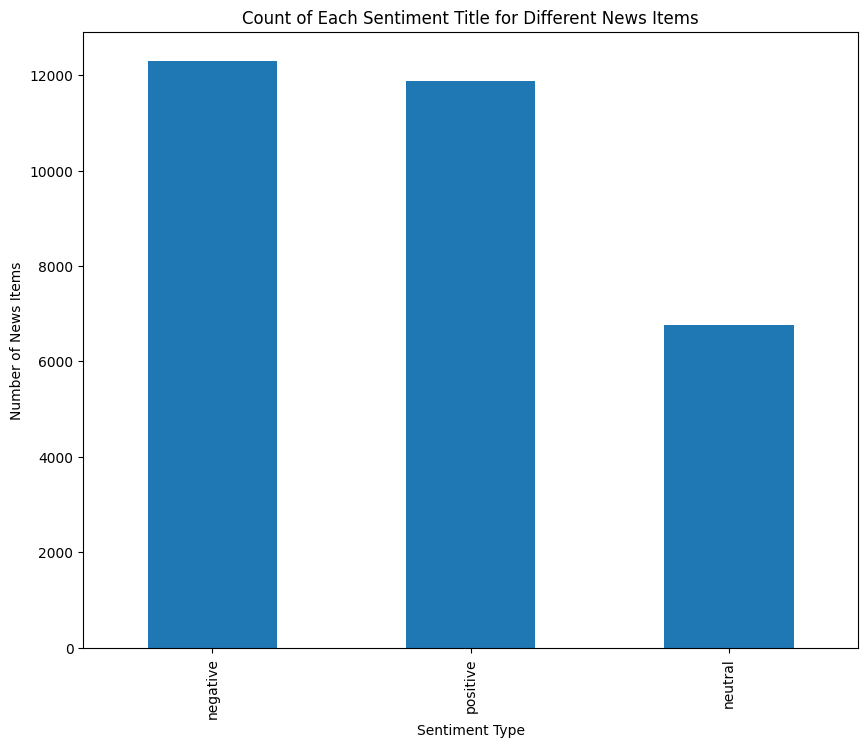

In [32]:
plt.figure(figsize=(10,8))
news.SentimentTitle_Category.value_counts().plot(kind='bar')
plt.title('Count of Each Sentiment Title for Different News Items')
plt.xlabel('Sentiment Type')
plt.ylabel('Number of News Items')

Text(0, 0.5, 'Number of News Items')

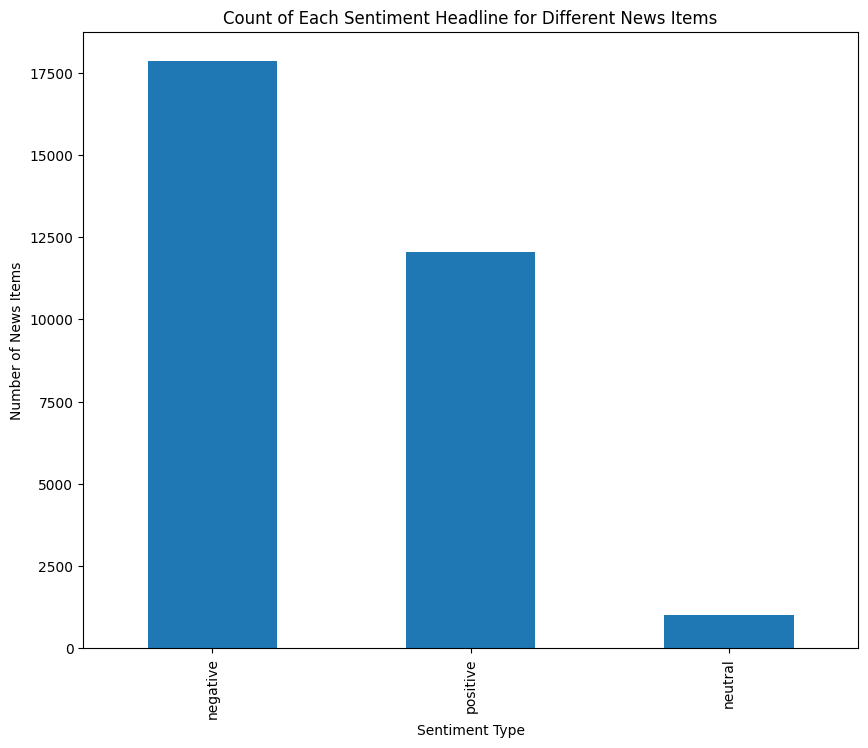

In [33]:
plt.figure(figsize=(10,8))
news.SentimentHeadline_Category.value_counts().plot(kind='bar')
plt.title('Count of Each Sentiment Headline for Different News Items')
plt.xlabel('Sentiment Type')
plt.ylabel('Number of News Items')

### 2. Topic wise popularity on social platforms

In [34]:
topic = ['Economy','Microsoft', 'Obama', 'Palestine']
facebook = abs(news.groupby(['Topic'])['Facebook'].sum())
googleplus = abs(news.groupby(['Topic'])['GooglePlus'].sum())
linkedin = abs(news.groupby(['Topic'])['LinkedIn'].sum())
popularity = facebook + googleplus + linkedin

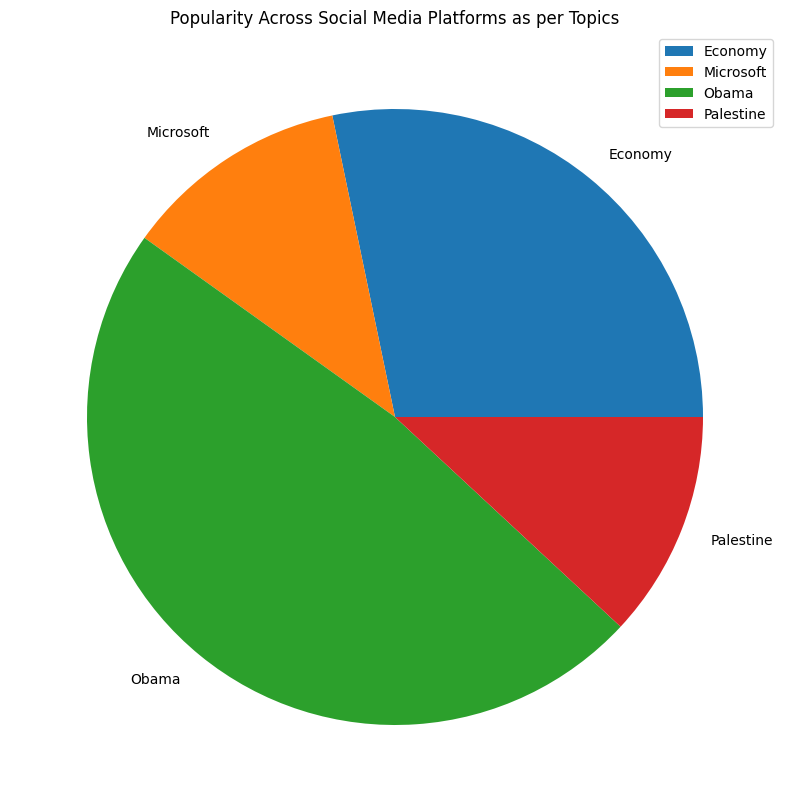

In [35]:
plt.figure(figsize=(10, 10))
plt.pie(popularity, labels=topic)
plt.title('Popularity Across Social Media Platforms as per Topics')
plt.legend(['Economy', 'Microsoft', 'Obama','Palestine'])
plt.show()

### 3. Platform based popularity at each hour

In [36]:
def popularity_per_hour(data, social_media):
    data['Hour'] = data['PublishTime'].apply(lambda x: str(x)[0:2])
    data=data.sort_values(by='Hour')
    ax = plt.figure(figsize=(18,7))
    sns.lineplot(data=data, y = social_media, x= 'Hour')
    plt.title(f'Popularity On {social_media} Per Hour')
    plt.xlabel('Hour')
    plt.ylabel(f'{social_media}')

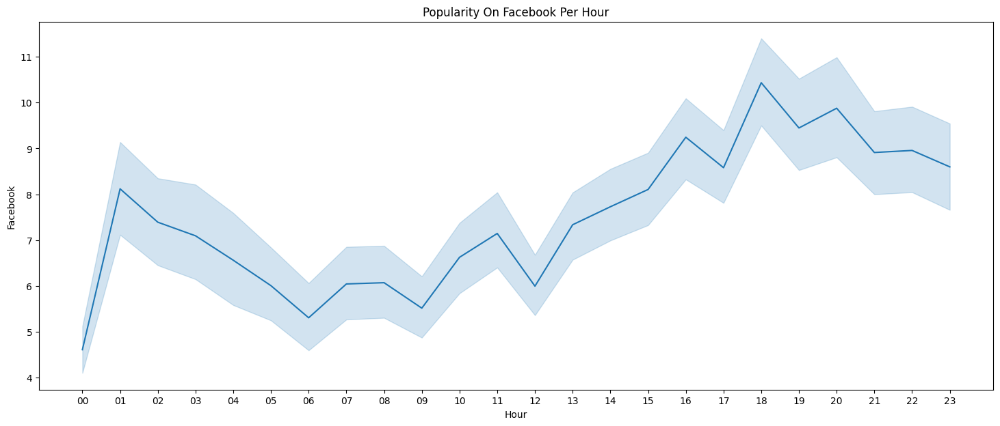

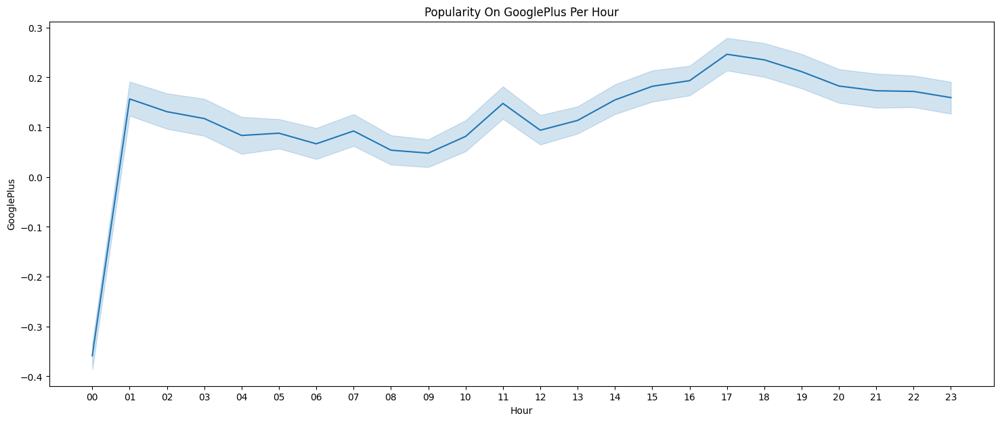

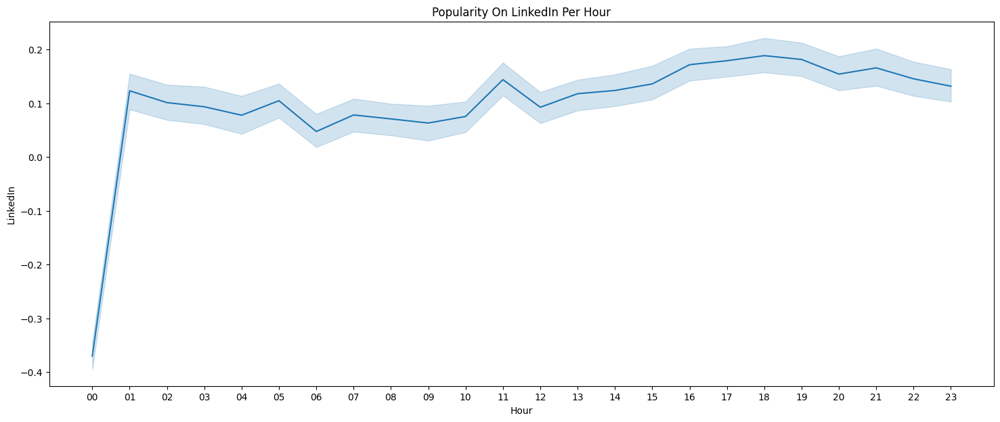

In [37]:
popularity_per_hour(news, "Facebook")
popularity_per_hour(news, "GooglePlus")
popularity_per_hour(news, "LinkedIn")

### 4. Topic-wise Popularity on each social media platform

In [38]:
topics=['Economy','Microsoft','Obama','Palestine']

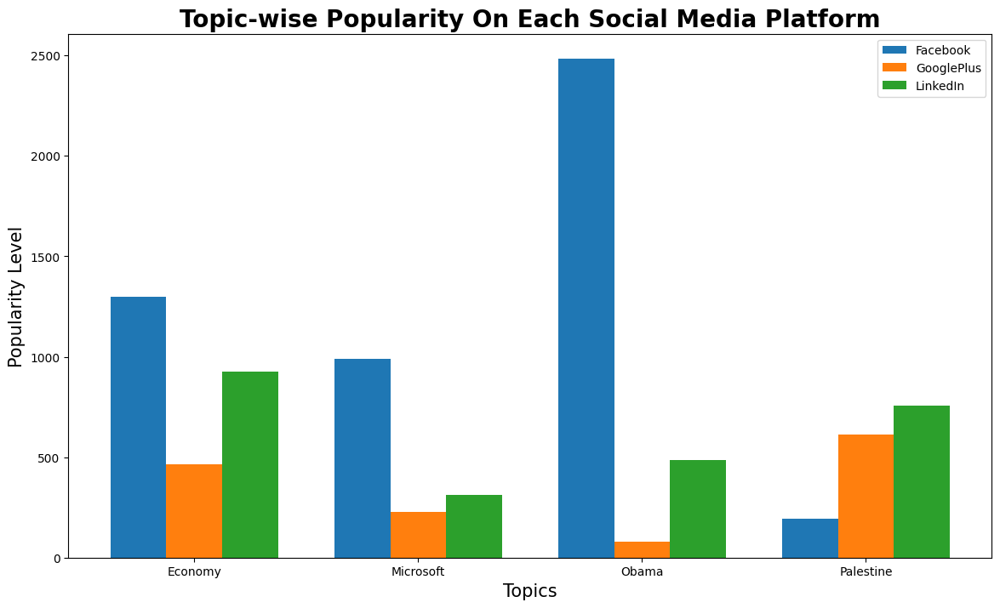

In [39]:
facebook = abs(news.groupby(['Topic'])['Facebook_scaled'].sum())
googleplus = abs(news.groupby(['Topic'])['GooglePlus_scaled'].sum())
linkedin = abs(news.groupby(['Topic'])['LinkedIn_scaled'].sum())

l = np.arange(len(topics))


plt.figure(figsize=(14,8))
plt.bar(l-0.25,facebook,width=0.25,label='Facebook')
plt.bar(l,googleplus,width=0.25,label='GooglePlus')
plt.bar(l+0.25,linkedin,width=0.25,label='LinkedIn')

plt.xticks(l, topics)
plt.legend()
plt.title('Topic-wise Popularity On Each Social Media Platform', fontdict={'size':20, 'fontweight' : 'bold'})
plt.xlabel('Topics', fontdict={'size':15})
plt.ylabel('Popularity Level', fontdict={'size':15})
plt.show()

### 5. News published each day

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0, 0.5, 'Count of News Published')

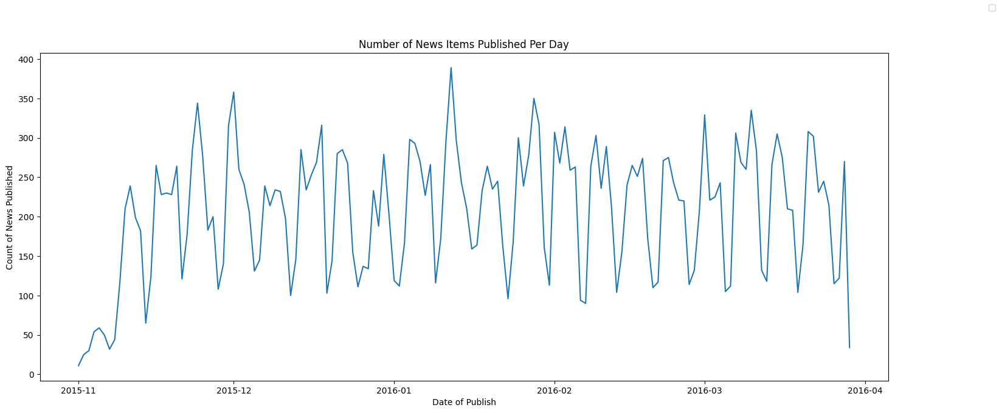

In [40]:
count_news = news.groupby('PublishDate').count()
ax = plt.figure(figsize=(18,7))
plt.plot(count_news.index, count_news['SentimentHeadline'])
ax.legend(ncol=2)
plt.title('Number of News Items Published Per Day')
plt.xlabel('Date of Publish')
plt.ylabel('Count of News Published')

#### News published per day on various factors

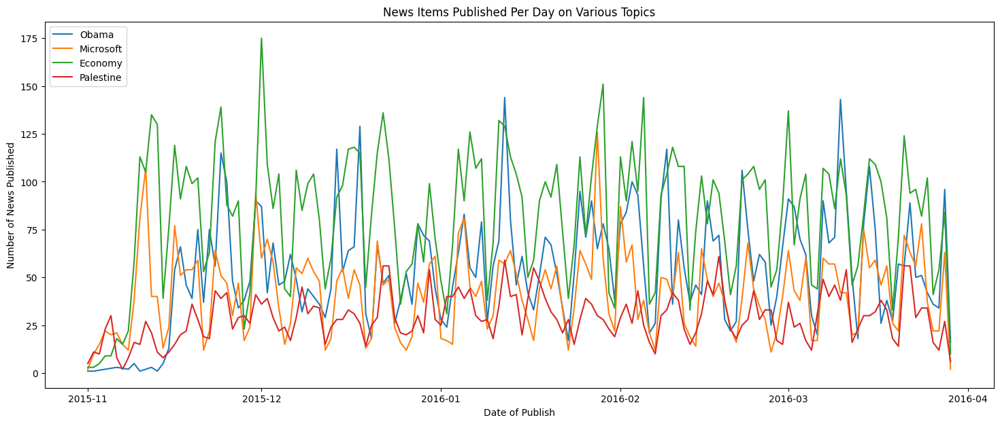

In [41]:
obama_news = news[news['Topic'] == 'obama']
microsoft_news = news[news['Topic'] == 'microsoft']
economy_news = news[news['Topic'] == 'economy']
palestine_news = news[news['Topic'] == 'palestine']

grp_obama = obama_news.groupby('PublishDate').count()
grp_microsoft = microsoft_news.groupby('PublishDate').count()
grp_economy = economy_news.groupby('PublishDate').count()
grp_palestine = palestine_news.groupby('PublishDate').count()

ax = plt.figure(figsize=(18,7))
plt.plot(grp_obama.index, grp_obama['SentimentHeadline'], label='Obama')
plt.plot(grp_microsoft.index, grp_microsoft['SentimentHeadline'], label='Microsoft')
plt.plot(grp_economy.index, grp_economy['SentimentHeadline'] , label='Economy')
plt.plot(grp_palestine.index, grp_palestine['SentimentHeadline'], label='Palestine')
plt.title('News Items Published Per Day on Various Topics')
plt.xlabel('Date of Publish')
plt.ylabel('Number of News Published')
plt.legend(loc=2)

### 6. Sentiment Change

In [42]:
temp_data=np.where((news['SentimentTitle_Category'] != 'positive') & (news['SentimentHeadline_Category'] !='negative')
                     ,'Title -ve Headline +ve' , 'Title +ve Headline -ve')

<Axes: ylabel='count'>

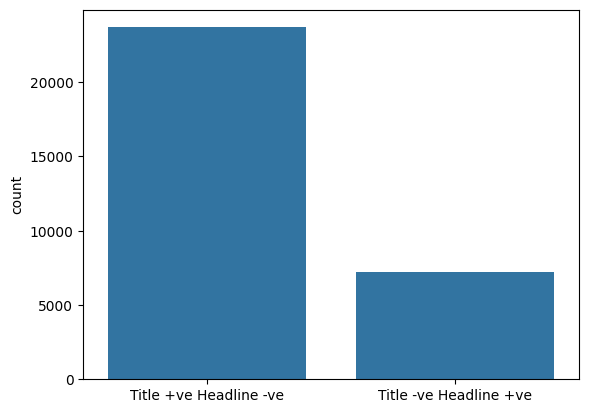

In [43]:
sns.countplot(x=temp_data, data= news)

### 7. Sentiment Density of Title and Headlines over different topics

In [44]:
def senti_density(palestine_news, obama_news, microsoft_news, economy_news, sentiment_type ):
    fig, axes = plt.subplots(2, 2, sharex=True,figsize=(10, 10))

    sns.histplot(ax= axes[0][0],data = palestine_news[sentiment_type], kde=True)
    axes[0][0].set_title('Palestine News')

    sns.histplot(ax= axes[0][1],data = obama_news[sentiment_type], kde=True)
    axes[0][1].set_title('Obama News')

    sns.histplot(ax= axes[1][0],data = microsoft_news[sentiment_type], kde=True)
    axes[1][0].set_title('Microsoft News')

    sns.histplot(ax= axes[1][1],data = economy_news[sentiment_type], kde=True)
    axes[1][1].set_title('Economy News')

    fig.suptitle('Sentiment Density')

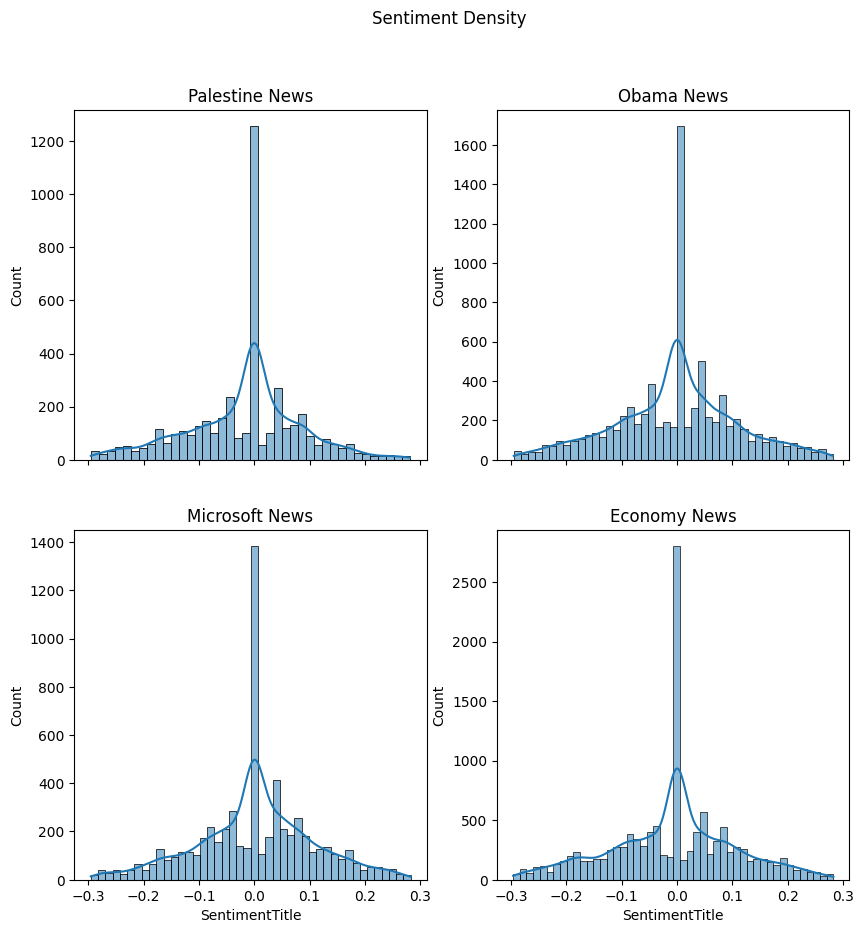

In [45]:
senti_density(palestine_news, obama_news, microsoft_news, economy_news, "SentimentTitle")

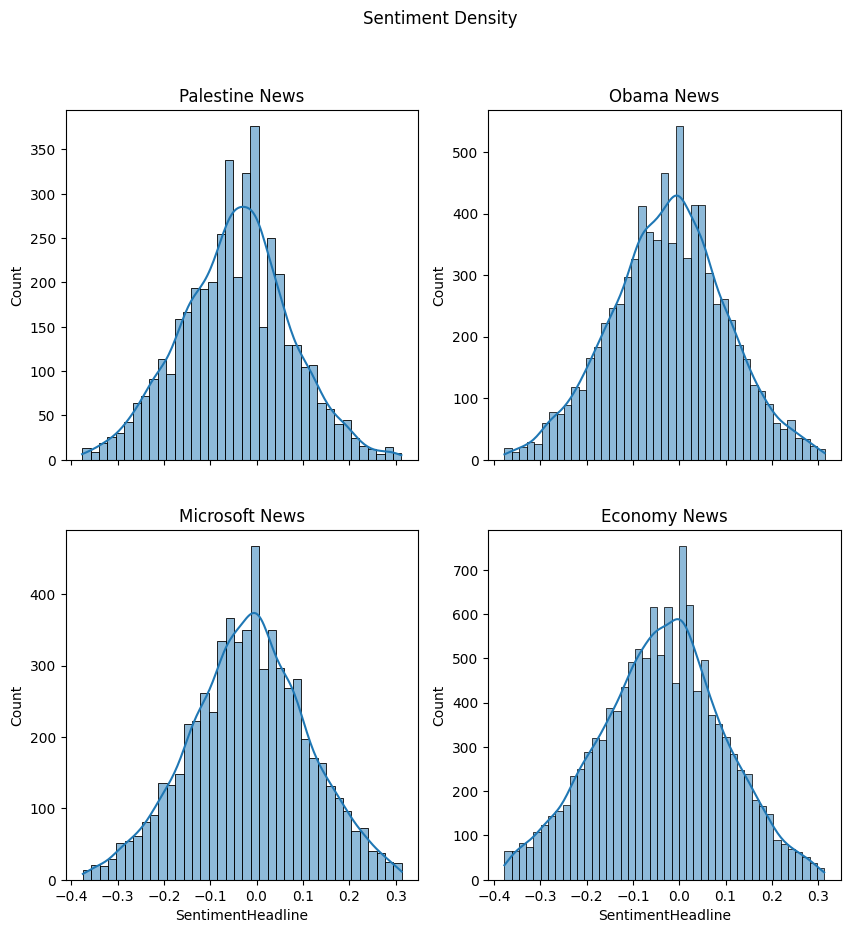

In [46]:
senti_density(palestine_news, obama_news, microsoft_news, economy_news, "SentimentHeadline")

### 8. Distribution of Sentiments of Title and Headlines over different platforms

In [47]:
def popularity_scatter(df, sentiment):
    soc_platform = df[['Facebook', 'GooglePlus', 'LinkedIn']]
    soc_platform = abs(soc_platform)
    soc_platform[f'{sentiment}_Category'] = df[f'{sentiment}_Category']

    scatter_data = soc_platform.melt(id_vars=[f'{sentiment}_Category'], value_vars=['Facebook', 'GooglePlus', 'LinkedIn'],
                                  var_name='Platform', value_name='Popularity')

    plt.figure(figsize=(10, 6))
    for category in scatter_data[f'{sentiment}_Category'].unique():
        category_data = scatter_data[scatter_data[f'{sentiment}_Category'] == category]
        plt.scatter(category_data['Platform'], category_data['Popularity'], label=category)

    plt.xlabel('Social Media Platform')
    plt.ylabel('Popularity Level')
    plt.title(f'{sentiment} Scatter Plot)')
    plt.legend()
    plt.show()

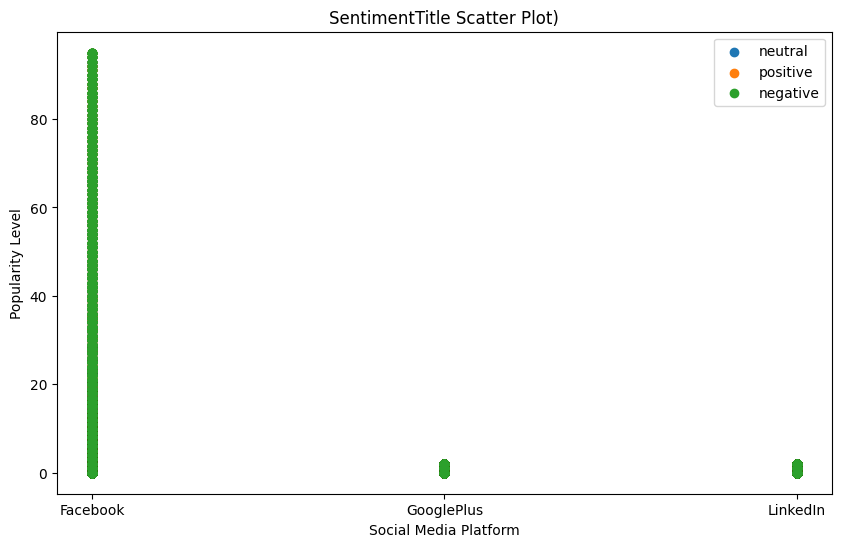

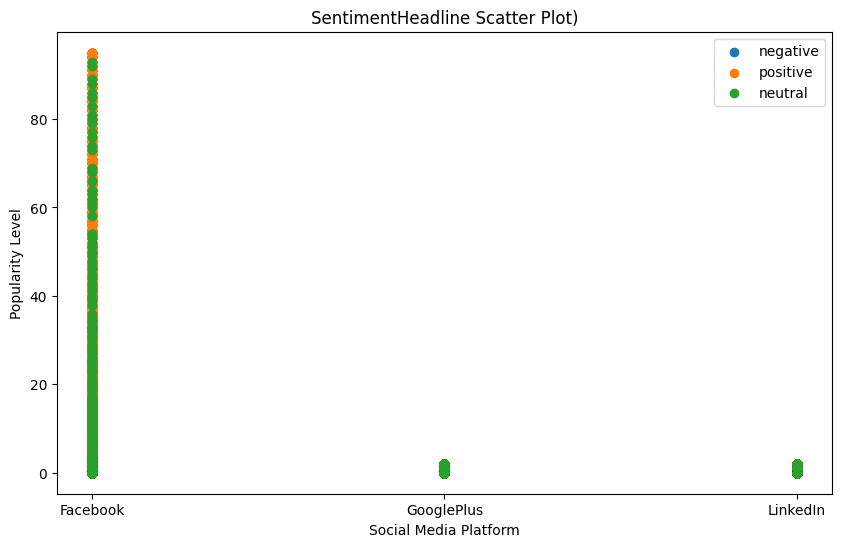

In [48]:
popularity_scatter(news, 'SentimentTitle')
popularity_scatter(news, 'SentimentHeadline')

### 9. Performing Log transformation on the platforms and plotting box plots

In [49]:
news.head()

,IDLink,Title,Headline,Topic,PublishDate,Facebook,GooglePlus,LinkedIn,SentimentTitle,SentimentHeadline,PublishTime,SentimentTitle_Category,SentimentHeadline_Category,Title_wl,Headline_wl,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,Source_type,Hour
0,lKg2pImhCl,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",palestine,2016-02-28,0,0,0,0.000000,-0.005906,14:03:00,neutral,negative,-0.374342,0.265931,0.000000,0.000000,0.000000,S4,14
1,zyHWDwPhDt,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,economy,2016-02-28,-1,-1,-1,0.051031,-0.037921,19:17:00,positive,negative,-0.374342,-0.763600,-0.671739,-1.165674,-1.102199,S4,19
2,ZOKue2cqfO,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,0,0,0,0.000000,0.048546,09:29:00,neutral,positive,-0.374342,-0.763600,0.000000,0.000000,0.000000,S4,09
3,JXfRvxs0R6,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,0,0,0,-0.243068,0.048546,00:15:00,negative,positive,-0.374342,0.952286,0.000000,0.000000,0.000000,S4,00
4,gcnDcVMGAo,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",microsoft,2015-11-01,-1,-1,-1,0.000000,0.115928,00:00:00,neutral,positive,1.071461,1.981817,-0.671739,-1.165674,-1.102199,S4,00


In [50]:
#perform log transformation first

temp_data = news.copy()
temp_data['Facebook'] = np.log10(temp_data['Facebook'][temp_data['Facebook']>0])
temp_data['GooglePlus'] = np.log10(temp_data['GooglePlus'][temp_data['GooglePlus']>0])
temp_data['LinkedIn'] = np.log10(temp_data['LinkedIn'][temp_data['LinkedIn']>0])

<Axes: xlabel='Source_type', ylabel='LinkedIn'>

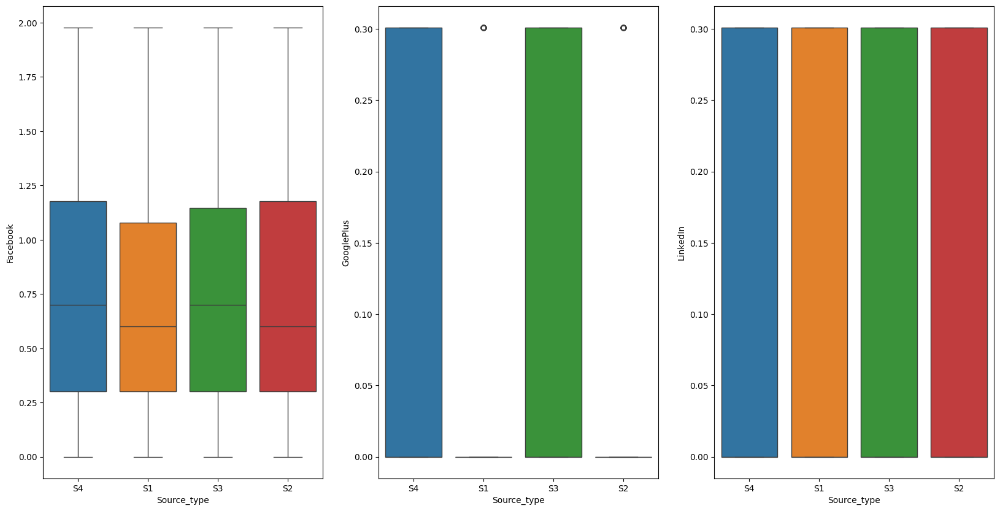

In [51]:
fig, axes = plt.subplots(1, 3, sharex=True, figsize=(20,10))


sns.boxplot(ax = axes[0],x="Source_type",y="Facebook", data=temp_data,hue='Source_type')
sns.boxplot(ax = axes[1],x="Source_type",y="GooglePlus", data=temp_data,hue='Source_type')
sns.boxplot(ax = axes[2],x="Source_type",y="LinkedIn", data=temp_data, hue='Source_type')

### 10. Pair plots

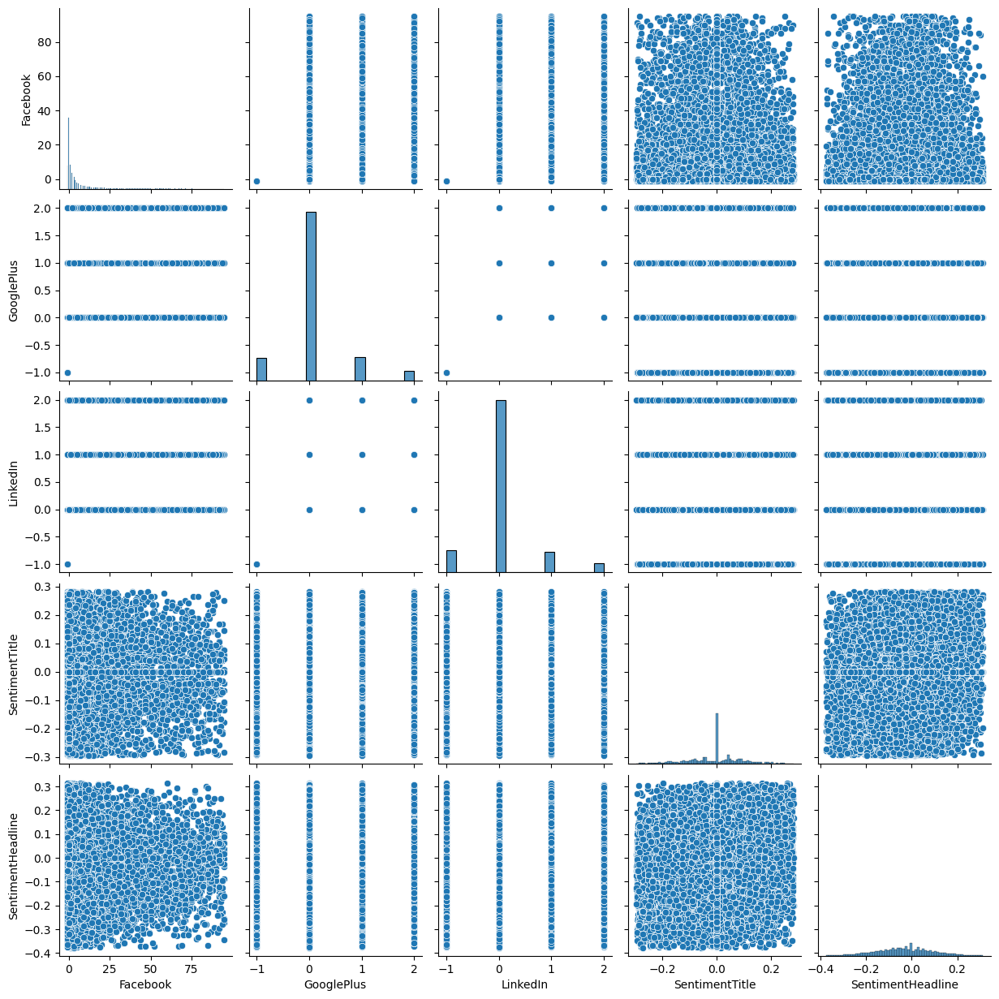

In [52]:
sns.pairplot(news[['Facebook', 'GooglePlus', 'LinkedIn', 'SentimentTitle', 'SentimentHeadline']])
plt.show()

### 11. Heatmap of 'SentimentHeadline','SentimentTitle','Facebook','GooglePlus','LinkedIn'

Text(0.5, 1.0, 'Sentiment HeatMap')

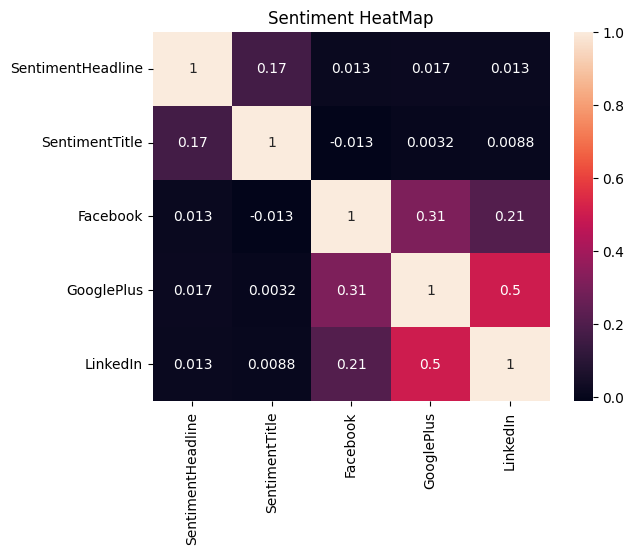

In [53]:
sns.heatmap(news[['SentimentHeadline','SentimentTitle','Facebook','GooglePlus','LinkedIn']].corr(),annot=True)
plt.title('Sentiment HeatMap')

### 12. Spread of Facebook, GooglePlus and LinkedIn Scores

In [54]:
cols = ['Facebook', 'GooglePlus', 'LinkedIn']
variance = news[cols].var()
std_dev = news[cols].std()
iqr = news[cols].quantile(0.75) - news[cols].quantile(0.25)

print("Variance:\n", variance)
print("\nStandard Deviation:\n", std_dev)
print("\nInterquartile Range:\n", iqr)

Variance:
 Facebook      233.904910
GooglePlus      0.371527
LinkedIn        0.354096
dtype: float64

Standard Deviation:
 Facebook      15.29395
GooglePlus     0.60953
LinkedIn       0.59506
dtype: float64

Interquartile Range:
 Facebook      7.0
GooglePlus    0.0
LinkedIn      0.0
dtype: float64


### Dropping all the irrelevant columns

In [55]:
irrelevant_columns = ['IDLink', 'Title', 'Headline', 'PublishDate',
                      'SentimentTitle','SentimentHeadline']
news.drop(columns = irrelevant_columns, inplace = True)

### One-hot encoding of 'Topic','SentimentTitle_Category','SentimentHeadline_Category','Source_type'

In [56]:
news = pd.get_dummies(news, columns=['Topic','SentimentTitle_Category','SentimentHeadline_Category','Source_type'])

print(news.shape)
news.head()

(30932, 24)


,Facebook,GooglePlus,LinkedIn,PublishTime,Title_wl,Headline_wl,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,Hour,...,SentimentTitle_Category_negative,SentimentTitle_Category_neutral,SentimentTitle_Category_positive,SentimentHeadline_Category_negative,SentimentHeadline_Category_neutral,SentimentHeadline_Category_positive,Source_type_S1,Source_type_S2,Source_type_S3,Source_type_S4
0,0,0,0,14:03:00,-0.374342,0.265931,0.000000,0.000000,0.000000,14,...,False,True,False,True,False,False,False,False,False,True
1,-1,-1,-1,19:17:00,-0.374342,-0.763600,-0.671739,-1.165674,-1.102199,19,...,False,False,True,True,False,False,False,False,False,True
2,0,0,0,09:29:00,-0.374342,-0.763600,0.000000,0.000000,0.000000,09,...,False,True,False,False,False,True,False,False,False,True
3,0,0,0,00:15:00,-0.374342,0.952286,0.000000,0.000000,0.000000,00,...,True,False,False,False,False,True,False,False,False,True
4,-1,-1,-1,00:00:00,1.071461,1.981817,-0.671739,-1.165674,-1.102199,00,...,False,True,False,False,False,True,False,False,False,True


# Phase 2

## Feature Selection



To remove features which are unimportant.

In [57]:
# Fetching Numerical Features and Dependent Features
from sklearn.model_selection import train_test_split

def split_data(df, social_media):
    x1 = df[['PublishSinTime','PublishCosTime','Title_wl','Headline_wl']]
    x2 = df.loc[:,'Source_type_S1':'Source_type_S4']

    for col in x2:
        x1[col] = x2[col]

    y1 = df[f'{social_media}']

    # Train-Test Split for each dependent feature
    x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size = 0.3, random_state=23)

    return x1_train, y1_train

In [58]:
from sklearn.ensemble import ExtraTreesRegressor

def show_feature_importance(df, social_media):
    x, y = split_data(df, social_media)
    model = ExtraTreesRegressor()
    model.fit(x,y)
    feat_importances = pd.Series(model.feature_importances_, index=x.columns)

    feat_importances.nlargest(17).plot(kind='bar')
    plt.xlabel('Features', fontdict = {'fontsize':15})
    plt.ylabel('Importance', fontdict = {'fontsize':15})
    plt.title('Feature Importance',fontdict = {'fontsize':22, 'fontweight':'bold'})
    plt.show()

In [59]:
import calendar

def work_with_time_and_date(df):
    # Changing time in Seconds
    df['PublishTime'] = df.PublishTime.apply(lambda x: (x.hour * 60 + x.minute) * 60 + x.second)
    seconds_in_day = 24*60*60

    # Making Time Cyclic
    df['PublishSinTime'] = df['PublishTime'].apply(lambda x: np.sin(2*np.pi*x/seconds_in_day))
    df['PublishCosTime'] = df['PublishTime'].apply(lambda x: np.cos(2*np.pi*x/seconds_in_day))

    df.drop(columns='PublishTime',inplace=True)

    # # Categorizing Months
    # df['PublishMonth'] = news['PublishDate'].apply(lambda x: calendar.month_name[x.month])

    return df

In [60]:
news = work_with_time_and_date(news.copy())

In [61]:
news.head()

,Facebook,GooglePlus,LinkedIn,Title_wl,Headline_wl,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,Hour,Topic_economy,...,SentimentTitle_Category_positive,SentimentHeadline_Category_negative,SentimentHeadline_Category_neutral,SentimentHeadline_Category_positive,Source_type_S1,Source_type_S2,Source_type_S3,Source_type_S4,PublishSinTime,PublishCosTime
0,0,0,0,-0.374342,0.265931,0.000000,0.000000,0.000000,14,False,...,False,True,False,False,False,False,False,True,-0.511293,-0.859406
1,-1,-1,-1,-0.374342,-0.763600,-0.671739,-1.165674,-1.102199,19,True,...,True,True,False,False,False,False,False,True,-0.944089,0.329691
2,0,0,0,-0.374342,-0.763600,0.000000,0.000000,0.000000,09,False,...,False,False,False,True,False,False,False,True,0.612217,-0.790690
3,0,0,0,-0.374342,0.952286,0.000000,0.000000,0.000000,00,False,...,False,False,False,True,False,False,False,True,0.065403,0.997859
4,-1,-1,-1,1.071461,1.981817,-0.671739,-1.165674,-1.102199,00,False,...,False,False,False,True,False,False,False,True,0.000000,1.000000


In [62]:
Platform = "Facebook" #@param ["Facebook", "GooglePlus", "LinkedIn"]

each feature is ordered in descending order according to the Gini Importance of each feature and the user selects the top k features according to their choice.

/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/1702369830.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x1[col] = x2[col]
/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/1702369830.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x1[col] = x2[col]
/var/folders/6b/hcmgcg951v75_fd0v_wnwk640000gn/T/ipykernel_41310/1702369830.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

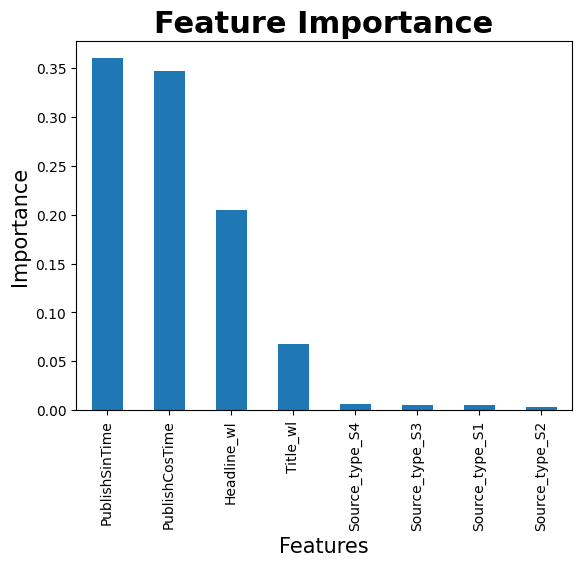

In [63]:
news = news.dropna()
show_feature_importance(news, Platform)

## Algorithms/Visualization

In [64]:
import plotly.express as px

def visualization(results_df, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_df = results_df[column_results].sort_values("mean_test_score", ascending=False)
    results_df = results_df.rename(shorten_param, axis=1)

    for col in results_df.columns:
        if col == 'param_random_state':
            continue
        try:
            results_df[col] = results_df[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_df,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',
    )
    fig.show()

In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    n = len(y_pred)
    k = independent_feature_length

    metrics_dict = {}
    metrics_dict['MSE'] = [mean_squared_error(y_test,y_pred)]  #MSE
    metrics_dict['RMSE'] = [np.sqrt(mean_squared_error(y_test,y_pred))] #RMSE
    metrics_dict['MAE'] = [mean_absolute_error(y_test,y_pred)] #MAE
    metrics_dict['R2_Score'] = [r2_score(y_test,y_pred)] #R2 Score
    metrics_dict['Adjusted_R2_Score'] = [1 - ((1-metrics_dict['R2_Score'][0])*(n-1)/(n-k-1))] #Adjusted R2 score
    metrics_dict['RMSLE'] = [np.log(np.sqrt(mean_squared_error(y_test,y_pred)))] #RMSLE

    metrics_df = pd.DataFrame(metrics_dict)

    print(metrics_df)

In [66]:
def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "neg_mean_squared_error", n_jobs=-1, factor=3, cv = 3 )

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'neg_mean_squared_error', cv = 3, n_iter = 50, n_jobs=-1)

    else:
        tuned_model = GridSearchCV(model, param_grid = parameters, scoring = 'neg_mean_squared_error', n_jobs=-1, cv = 3)


    start_time = time.time()

    if type(model).__name__ == 'CatBoostRegressor':
        tuned_model.fit(x_train, y_train, verbose = False)
    else:
        tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model

In [67]:
def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, social_media, tuning_model):
    print('-----'*10+f'\n{type(model).__name__} for {social_media}\n'+'-----'*10)

    if type(model).__name__ == 'CatBoostRegressor':
        model.fit(x_train, y_train, verbose = False)
    else:
        model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)

    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)

In [68]:
def ml_algorithm_implementation(df, model, parameters, social_media, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x_cols = [x for x in df.columns if x not in ['Facebook_scaled','LinkedIn_scaled','GooglePlus_scaled']]

    x = df[x_cols]
    y = df[[f'{social_media}_scaled']]

    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=23)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, social_media, tuning_model)


In [69]:
Social_Media = "Facebook" #@param ["Facebook", "GooglePlus", "LinkedIn"]

In [70]:
Tuning_Method = "Halving_Randomized_Search_CV"

In [71]:
# Include numeric and boolean columns
news_numeric_and_boolean = news.select_dtypes(include=[np.number, 'bool']).dropna()


## 1. Decision Trees

In [72]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingRandomSearchCV
import time


# Decision Tree
parameters_decision_tree = {"splitter":["best","random"],
            "max_depth" : [None,5,7,9],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0.0, 0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,30,40,50,60],
           'random_state':[23]}

ml_algorithm_implementation(news_numeric_and_boolean, DecisionTreeRegressor( random_state = 0), parameters_decision_tree, Social_Media, Tuning_Method, False)

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
DecisionTreeRegressor for Facebook
--------------------------------------------------

Evaluation of DecisionTreeRegressor before tuning:
--------------------------------------------------
            MSE          RMSE           MAE  R2_Score  Adjusted_R2_Score  \
0  8.174753e-30  2.859152e-15  1.306178e-15       1.0                1.0   

       RMSLE  
0 -33.488251  


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:547: FitFailedWarning: 
1446 fits failed out of a total of 5895.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1106 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py", line 1467, in wrapper
    estimator._validate_params()
  File "/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_co

**************************************************
Best Score for DecisionTreeRegressor : -0.00011374269047217966 
---
Best Parameters for DecisionTreeRegressor : {'splitter': 'best', 'random_state': 23, 'min_weight_fraction_leaf': 0.0, 'min_samples_leaf': 3, 'max_leaf_nodes': 60, 'max_features': None, 'max_depth': None}
--------------------------------------------------
Elapsed Time: 00:00:05

Evaluation of DecisionTreeRegressor after tuning:
--------------------------------------------------
      MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.0001  0.010019  0.002805  0.999855           0.999854 -4.603242


## 2. CatBoost

In [73]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [74]:
import catboost as cb

# Catboost
parameters_catboot = {'iterations': [100, 150, 200, 250],
        'learning_rate': [0.01,0.02,0.03,0.04],
        'depth': [4,5,6,7,8,9, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3],
        'random_state':[23]}

ml_algorithm_implementation(news_numeric_and_boolean, cb.CatBoostRegressor(loss_function='RMSE',random_state = 23), parameters_catboot, Social_Media, Tuning_Method, False)


################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
CatBoostRegressor for Facebook
--------------------------------------------------

Evaluation of CatBoostRegressor before tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.000002  0.001565  0.000501  0.999996           0.999996 -6.459632


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning:

The total space of parameters 448 is smaller than n_iter=1965. Running 448 iterations. For exhaustive searches, use GridSearchCV.



**************************************************
Best Score for CatBoostRegressor : -0.00964270521998883 
---
Best Parameters for CatBoostRegressor : {'random_state': 23, 'learning_rate': 0.02, 'l2_leaf_reg': 3, 'iterations': 200, 'depth': 4}
--------------------------------------------------
Elapsed Time: 00:00:12

Evaluation of CatBoostRegressor after tuning:
--------------------------------------------------
        MSE      RMSE      MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.001783  0.042228  0.02987  0.997426           0.997415 -3.164676


## 3. LightGBM

In [75]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [76]:
from lightgbm import LGBMRegressor

# LightGBM
parameters_lightgbm = {'n_estimators':[50,100, 120,150,200],
                       'learning_rate':[.001,0.01,.1],
                       'max_depth':[-1,1,2,4],
                       'subsample':[.5,.75,1],
                       'random_state':[25]}

ml_algorithm_implementation(news_numeric_and_boolean, LGBMRegressor(random_state = 20), parameters_lightgbm, Social_Media, Tuning_Method, False)

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
LGBMRegressor for Facebook
--------------------------------------------------
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 674
[LightGBM] [Info] Number of data points in the train set: 11795, number of used features: 21
[LightGBM] [Info] Start training from score 0.002401

Evaluation of LGBMRegressor before tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.000002  0.001321  0.000092  0.999997           0.999997 -6.629197
[LightGBM] [Warning] There are no meaning

/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning:

The total space of parameters 180 is smaller than n_iter=1965. Running 180 iterations. For exhaustive searches, use GridSearchCV.



[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Start training from score -0.218905
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM]

## 4. Gradient Boosting Regressor

In [77]:
from sklearn.ensemble import GradientBoostingRegressor

param_gbr={'n_estimators':[50,100,200, 300],
            'learning_rate':[.001,0.01,.1,1],
            'max_depth':[1,2,3,4,5],
            'subsample':[.5,.75,1,.1],
            'random_state':[3]}

ml_algorithm_implementation(news_numeric_and_boolean, GradientBoostingRegressor(random_state = 23), param_gbr, Social_Media, Tuning_Method, False)

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
GradientBoostingRegressor for Facebook
--------------------------------------------------


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




Evaluation of GradientBoostingRegressor before tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.000008  0.002867  0.001024  0.999988           0.999988 -5.854577


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning:

The total space of parameters 320 is smaller than n_iter=1965. Running 320 iterations. For exhaustive searches, use GridSearchCV.

/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when

**************************************************
Best Score for GradientBoostingRegressor : -0.00019551533045604374 
---
Best Parameters for GradientBoostingRegressor : {'subsample': 0.5, 'random_state': 3, 'n_estimators': 300, 'max_depth': 2, 'learning_rate': 0.1}
--------------------------------------------------
Elapsed Time: 00:00:09

Evaluation of GradientBoostingRegressor after tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.000027  0.005174  0.002594  0.999961           0.999961 -5.264113


## 5. KNN

In [78]:
from sklearn.neighbors import KNeighborsRegressor

param_knn =  { 'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan'],
              'n_jobs':[-1]}

ml_algorithm_implementation(news_numeric_and_boolean, KNeighborsRegressor(), param_knn, Social_Media, Tuning_Method, False)

################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
KNeighborsRegressor for Facebook
--------------------------------------------------



Evaluation of KNeighborsRegressor before tuning:
--------------------------------------------------
      MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.0071  0.084264  0.031493   0.98975           0.989707 -2.473798


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:318: UserWarning:

The total space of parameters 36 is smaller than n_iter=1965. Running 36 iterations. For exhaustive searches, use GridSearchCV.

/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

**************************************************
Best Score for KNeighborsRegressor : -0.07369289603531785 
---
Best Parameters for KNeighborsRegressor : {'weights': 'distance', 'n_neighbors': 5, 'n_jobs': -1, 'metric': 'euclidean'}
--------------------------------------------------
Elapsed Time: 00:00:00

Evaluation of KNeighborsRegressor after tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.006252  0.079067  0.028828  0.990975           0.990938 -2.537461


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1051: UserWarning:

One or more of the test scores are non-finite: [        nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
 -0.1562051  -0.07588729         nan         nan         nan         nan
 -0.09472983 -0.08322972 -0.06993048 -0.06570723         nan         nan
 -0.31041213 -0.48092534 -0.45585044 -0.37129759]

/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1051: UserWarning:

One or more of the train scores are non-finite: [        nan         nan         nan         n

## 6. Random Forest

In [79]:
from sklearn.ensemble import RandomForestRegressor

parameters_random_forest = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 5, 7, 9],
    "min_samples_leaf": [1, 2, 3, 4, 5],
    "min_weight_fraction_leaf": [0.0, 0.1, 0.2],
    "max_features": ["auto", "sqrt", "log2", None],
    "max_leaf_nodes": [None, 20, 30, 40, 50],
    'random_state': [23]
}


ml_algorithm_implementation(news_numeric_and_boolean, RandomForestRegressor(random_state=0), parameters_random_forest, Social_Media, Tuning_Method, False)

/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
RandomForestRegressor for Facebook
--------------------------------------------------

Evaluation of RandomForestRegressor before tuning:
--------------------------------------------------
            MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  4.040336e-07  0.000636  0.000038  0.999999           0.999999 -7.360884


/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/aish/Desktop/src/env/lib/python3.12/site-packages/sklearn/base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was exp

**************************************************
Best Score for RandomForestRegressor : -3.8519010334845516e-05 
---
Best Parameters for RandomForestRegressor : {'random_state': 23, 'n_estimators': 200, 'min_weight_fraction_leaf': 0.0, 'min_samples_leaf': 2, 'max_leaf_nodes': None, 'max_features': None, 'max_depth': None}
--------------------------------------------------
Elapsed Time: 00:02:05

Evaluation of RandomForestRegressor after tuning:
--------------------------------------------------
            MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  1.928105e-07  0.000439  0.000034       1.0                1.0 -7.730779


# Phase 3

Saving the transformed csv as sentiment_analysis.csv for easier modelling and visualization on UI.

In [80]:

news.to_csv('sentiment_analysis.csv', index=False)
